# Digital Image Processing - Programming Assignment 3
##JPEG and LZW Encoding

(**NOTE:** Run entire code once for displaying outputs. I've removed the output images to reduce the file size.)

In [ ]:
# IMPORTING REQUIRED LIBRARIES
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import scipy
import urllib.request
from PIL import Image
import os
import math
from skimage.measure import shannon_entropy

In [ ]:
# create folder for follwoing:
#    - color images
#    - gray images
#    - lzw encoded files
#    - jpeg encoded files

dirs = ["./color_images", "./gray_images", "./lzw_files", "./jpeg_files"]
for dir in dirs:
  if not os.path.isdir(dir):
    os.mkdir(dir)

###Loading Images from Dataset

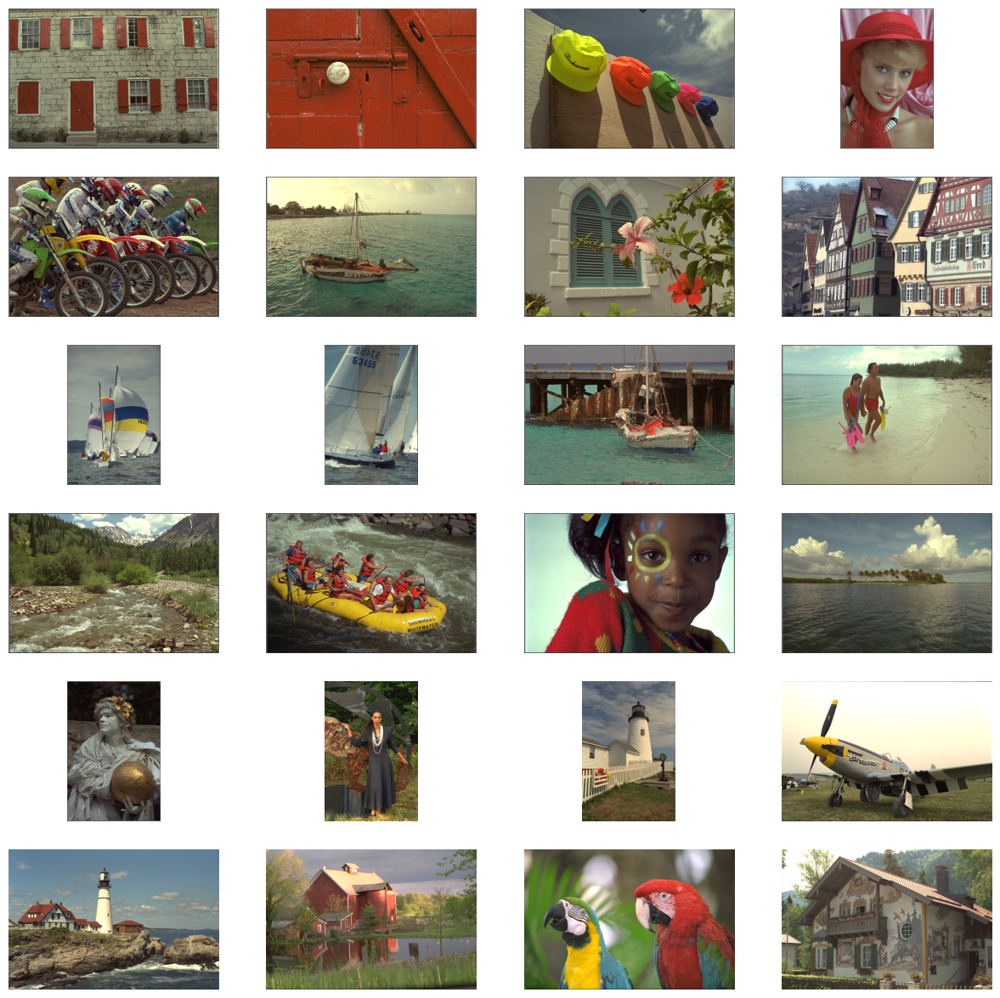

In [ ]:
# Loading the Kodak dataset
# storing images in an image array

n_images = 24
images = []   # array to store the name of 24 images of the dataset

fig, axes = plt.subplots(nrows=6,ncols=4, figsize=(15,15))
for i in range(n_images):
  img_number = str(i+1)
  if(len(img_number)==1):
    img_number = '0'+img_number
  img_name = f"kodim{img_number}.png"
  images.append(img_name)

  file_name = os.path.join("./color_images", img_name)

  url = f"https://r0k.us/graphics/kodak/kodak/{img_name}"
  urllib.request.urlretrieve(url,os.path.join(file_name))

  img = np.asarray(Image.open(file_name))
  axes[i//4, int(i%4)].imshow(img)
  axes[i//4, int(i%4)].axis('off')
plt.show()

###Loading Images from Google Drive

In [ ]:
## download directory containing all files
dir_id = '1loI29E1XBIgS7hEeADGBrCKl2-e03EsU'
dir_name = './gray_images'

zip_dir_name = f"{dir_name}.zip"

## download directory
!gdown $dir_id -O ./$zip_dir_name

## unzip directory
!unzip -q -o $zip_dir_name

## delete zipped directory
!rm -rf $zip_dir_name

Downloading...
From: https://drive.google.com/uc?id=1loI29E1XBIgS7hEeADGBrCKl2-e03EsU
To: /content/gray_images.zip
100% 1.60M/1.60M [00:00<00:00, 50.2MB/s]


##JPEG




In [ ]:
# 8*8 Quantization matrix for jpeg - Standard
Q = [[16, 11, 10, 16, 24, 40, 51, 61],
    [12, 12, 14, 19, 26, 58, 60, 55],
    [14, 13, 16, 24, 40, 57, 69, 56],
    [14, 17, 22, 29, 51, 87, 80, 62],
    [18, 22, 37, 56, 68,109,103, 77],
    [24, 35, 55, 64, 81,104,113, 92],
    [49, 64, 78, 87,103,121,120,101],
    [72, 92, 95, 98,112,100,103, 99]]
Q = np.array(Q)

q = Q

# Function which takes an image and returns the block starting from the index(i,j)
def get_block(img, i,j, block_size):
  h,w = img.shape
  block = img[i:i+block_size,j:j+block_size]
  # add zero padding if necessary
  if(i+block_size>=h or j+block_size>=w):
    padded_block = np.zeros((block_size,block_size))
    for i1 in range(i,min(i+block_size,h)):
      for j1 in range(j,min(j+block_size,w)):
        padded_block[i1-i,j1-j] = img[i1,j1]
    block = padded_block
  return block

# Function to restore block to image at index (i,j)
def set_block(img, i,j, block):
  h,w = img.shape
  n = len(block)
  for i1 in range(i,int(min(i+n,h))):
    for j1 in range(j,int(min(j+n,w))):
      img[i1,j1] = block[i1-i,j1-j]
  return img

# Function which takes a block and a constant by which the block needs to be level shifted
# Returns the block shifted by const
# Takes a uint8 block and returns an int8 block
def level_shift(block, const):
  new_block = np.int8(np.zeros(block.shape))
  for i in range(len(block)):
    for j in range(len(block)):
      new_block[i,j] = block[i,j] - const
  return new_block

# returns a uint8 block after right shifting by constant
def level_reshift(block, const):
  new_block = np.uint8(np.zeros(block.shape))
  for i in range(len(block)):
    for j in range(len(block)):
      new_block[i,j] = block[i,j] + const
  return new_block

# Function which takes an np 2d array as input and returns its DCT
def dct(block):
  # Calling the Inbuilt scipy function for Multi Dimensional DCT
  dct_block = scipy.fft.dctn(block, type =2, norm = "ortho")
  return dct_block

# Function which takes an np 2d array as input and returns its IDCT
def idct(block):
  # Calling the Inbuilt scipy function for Multi Dimensional IDCT
  idct_block = scipy.fft.idctn(block, type =2, norm = "ortho")
  return idct_block

# Function which takes a block as input and returns the image divided
# by the Quantization matrix(q)
def quantization(X,q):
  quantized_X = np.int16(np.round(X/q))
  return quantized_X

# Function which takes a block as input and returns the image multiplied
# by the Quantization matrix(q)
def dequantization(X,q):
  dequantized_X = X*q
  return dequantized_X

# Function to resize 8*8 standard quantization matrix Q to any other size
def resize_Q(block_size, to_print = True):
  resized_Q = cv2.resize(Q.astype("float64"),
                         dsize=(block_size, block_size),
                         interpolation=cv2.INTER_CUBIC)
  resized_Q = np.rint(resized_Q).astype(Q.dtype)

  if to_print:
    # print resized quantization matrix
    print(f"Quantizaton matrix for block size {block_size}:\n")
    print(resized_Q,"\n")
  return resized_Q

def YUV2BGR(yuv):
  m = np.array([[ 1.0, 1.0, 1.0],
                [ 1.7720025777816772, -0.3441331386566162, -0.000007154783816076815],
                [ 0.00001542569043522235, -0.7141380310058594 , 1.4019975662231445] ])

  bgr = np.dot(yuv,m)
  bgr[:,:,0]-=226.8183044444304
  bgr[:,:,1]+=135.45870971679688
  bgr[:,:,2]-=179.45477266423404

  return bgr

def get_coeff_parameters(block, n_coeff):
  # return an array of n_coeff coefficient parameters
  # if n_coeff = -1, i.e., all coefficients are to be sent, send coeffs until sequence of zeros encountered
  slice_zeros = False
  if n_coeff == -1:
    n_coeff = block.size
    slice_zeros = True

  i,j = 0,0
  # 1 denotes diagonally up, 0 denotes diagonally down
  dir = 1
  # array for zig-zag output
  output_arr = np.zeros(n_coeff)
  h, w = block.shape
  for ind in range(n_coeff):
    output_arr[ind] = block[i,j]
    i -= dir
    j += dir
    if i < 0 and j >= w:
      i = 1
      j = w-1
      dir *= -1
    elif i >= h and j < 0:
      j = 1
      i = h-1
      dir *= -1
    elif i < 0:
      i = 0
      dir *= -1
    elif i >= h:
      j += 2
      i = h-1
      dir *= -1
    elif j < 0:
      j = 0
      dir *= -1
    elif j >= w:
      i += 2
      j = w-1
      dir *= -1

  if slice_zeros and output_arr[-1]==0:
    ind = len(output_arr)-1
    while ind>0 and output_arr[ind-1]==0:
      ind-=1
    output_arr = output_arr[:ind+1]
  return output_arr

def set_coeff_parameters(coeff_arr, block_size):
  # set the coeff array to block
  i,j = 0,0
  # 1 denotes diagonally up, 0 denotes diagonally down
  dir = 1
  # output block
  output_block = np.zeros((block_size, block_size))
  h, w = block_size, block_size
  for ind in range(len(coeff_arr)):
    output_block[i,j] = coeff_arr[ind]
    i -= dir
    j += dir
    if i < 0 and j >= w:
      i = 1
      j = w-1
      dir *= -1
    elif i >= h and j < 0:
      j = 1
      i = h-1
      dir *= -1
    elif i < 0:
      i = 0
      dir *= -1
    elif i >= h:
      j += 2
      i = h-1
      dir *= -1
    elif j < 0:
      j = 0
      dir *= -1
    elif j >= w:
      i += 2
      j = w-1
      dir *= -1
  return output_block

###Encoding:

1. Level Shifting by 128
2. Discrete Cosine Transfrom(DCT)
3. Quantization stage



In [ ]:
# STEPS FOR JPEG ENCODING:

def jpeg_encoder(img_name, block_size , n_coeff = -1, color = 'gray'):
  global q, Q
  img = []
  h, w, channels = 0,0,0
  if color == 'gray':   # Image is Grayscale
    img = cv2.imread(img_name,cv2.IMREAD_GRAYSCALE)
    h,w = img.shape
    img = img.reshape((h,w,1))
    channels = 1
  else:                 # Color Image
    img = cv2.imread(img_name)
    h,w,channels = img.shape
    # Convert Image from BGR to YUV before compression
    img = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    # print("After conversion to YUV:\n")
    # print(img,"\n\n")
    # cv2_imshow(img)

  # lzw encoding file name
  file_name = os.path.join("./jpeg_files",
                           os.path.basename(img_name).split(".")[0]+".txt")
  # open file and write
  jpeg_file = open(file_name, "w")

  # 2-D array to store the jpeg encoding
  # Each row in array represents one block.
  jpeg_encoded_arr = []
  q = Q # Quantization matrix to be used
  if(block_size != 8):
    q = resize_Q(block_size)
  # Looping over image to get blocks one by one and perform jpeg compression on each
  for c in range(channels):
    for i in range(0,h,block_size):
      for j in range(0,w,block_size):
        # Getting the current block_size*block_size block
        block = get_block(img[:,:,c], i,j,block_size)
        # if(c==2):
          # print("Orig block:\n",block)
        block = level_shift(block,128)
        # print("Level shifted:\n",block)
        block_dct = dct(block)
        # print("DCT:\n",block_dct)
        block_quantized = quantization(block_dct,q)
        # print("Quantized:\n",block_quantized)

        block_coeffs = get_coeff_parameters(block_quantized, n_coeff)
        # print(f"Coefficients sent for channel:{c}:\n",block_coeffs)

        # write to file
        jpeg_file.write(" ".join(map(str, block_coeffs))+"\n")

        # Adding the block to the jpeg encoded array
        jpeg_encoded_arr.append(block_coeffs)

  jpeg_file.close()

  return jpeg_encoded_arr



###Decoding:
1. De-quantization
2. Inverse Discrete Cosine Transfrom(IDCT)
3. Level Shifting by 128

In [ ]:
def jpeg_decoder(orig_img_name, block_size, n_coeff, color, jpeg_encoded_arr):
  global q,Q
  orig_img = cv2.imread(orig_img_name)
  h, w, channels = 0,0,1
  if(color == 'gray'):    # Image is Grayscale
    orig_img = cv2.imread(orig_img_name, cv2.IMREAD_GRAYSCALE)
    h,w = orig_img.shape
  else:                   # Color Image
    h,w,channels = orig_img.shape

  decoded_img = np.zeros((h,w,channels))

  # variable to store the number of blocks in one channel
  n_blocks = math.ceil(h/block_size) * math.ceil(w/block_size)

  i1,j1 = 0,0   # variables to store image indices after block restoration
  # Looping over encoded stream to get 'n_blocks' blocks for each channel
  # and perform jpeg decompression on each
  # Each row represents one block
  n = len(jpeg_encoded_arr)
  c = 0 # current channel

  q = Q
  if(block_size != 8):
    q = resize_Q(block_size, False)

  num_encoded_pixels = 0  # variable to store the total number of pixels received after compression
  for i in range(n):
    # getting the channel
    c = (i)//n_blocks
    if i % n_blocks == 0:
      i1, j1 = 0, 0
    # Get one block's coefficients
    block_coeffs = jpeg_encoded_arr[i]
    num_encoded_pixels += len(block_coeffs)
    block = set_coeff_parameters(block_coeffs, block_size)
    # print(f"Received Coeff parameters for channel: {c}:\n",block_coeffs)
    block_dequantized = dequantization(block,q)
    # print("Dequantized parameters:\n",block_dequantized)
    block_idct = idct(block_dequantized)
    # print("Inverse DCT:\n",block_idct)
    block = level_reshift(block_idct,128)
    # if(c == 2):
      # print("Reshifted:\n",block)

    # Putting the block in the image
    decoded_img[:,:,c] = set_block(decoded_img[:,:,c], i1,j1,block)

    j1+=block_size
    if(j1>=w):
      j1=0
      i1+=block_size

  if(color == 'gray'):  # reshaping into 2D
    decoded_img = decoded_img.reshape((h,w))
  else:
    # Convert Image from YUV to BGR before analysis
    # decoded_img = cv2.cvtColor(decoded_img.astype('float32'), cv2.COLOR_YUV2BGR)
    decoded_img = YUV2BGR(decoded_img.astype('float32'))
    # print("After conversion from YUV to BGR:\n")
  # cv2_imshow(decoded_img)
  rmse = (np.sum((orig_img - decoded_img)**2)/(h*w))**0.5
  psnr = 20 * np.log10(255/rmse)
  # calculating the compression ratio
  # 8 bits pixels were sent and received
  comp_ratio = (n_blocks * channels * (block_size ** 2) * 8)/(num_encoded_pixels * 8)

  return (decoded_img, rmse, psnr, comp_ratio)

**JPEG COMPRESSION ANALYSIS**

KeyboardInterrupt: ignored

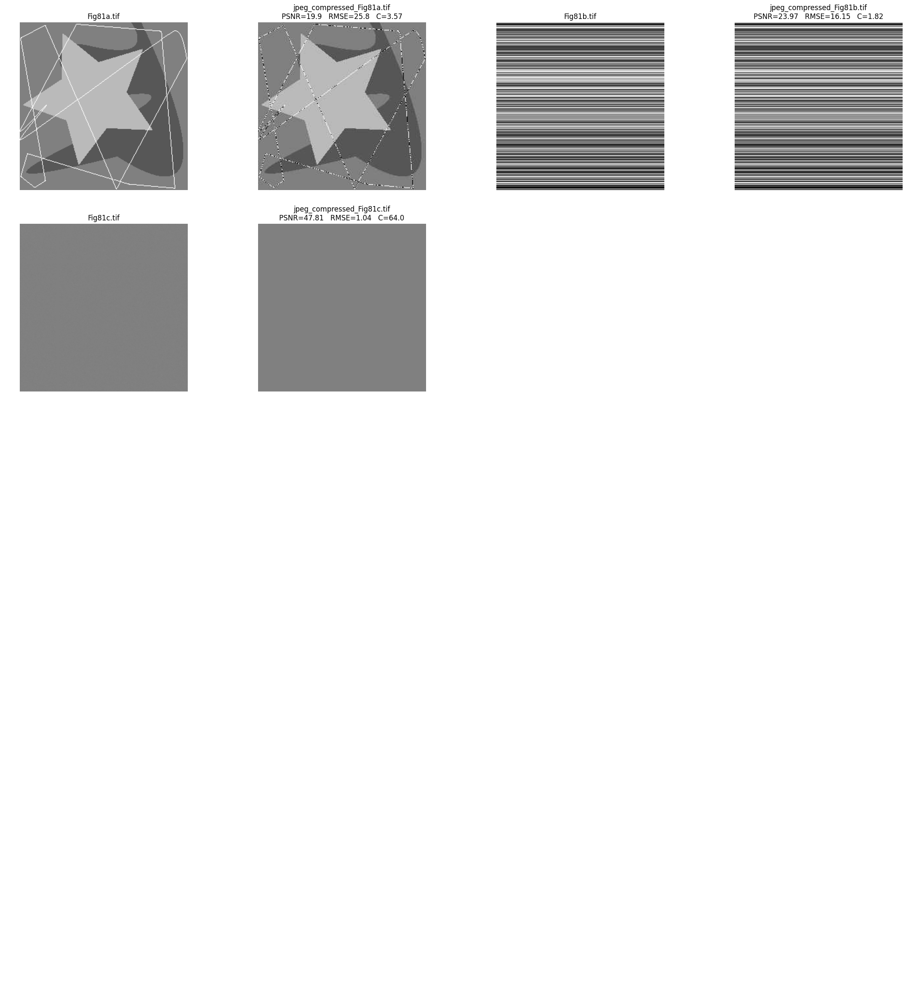

In [ ]:
def test_jpeg(dir_name, color = 'color'):

  block_size = 8
  n_coeff = -1

  images = os.listdir(dir_name)
  images.sort()

  num_images = len(images)
  num_cols = 4
  num_rows = int(2*num_images/num_cols)

  fig = plt.figure(figsize=(28, 6*num_rows))
  plt.axis("off")

  index = 1

  rmse_arr = []
  psnr_arr = []
  comp_ratio_arr = []

  for img_name in images:
    img_path = os.path.join(dir_name, img_name)

    original_img = cv2.imread(img_path)

    encoded_arr = jpeg_encoder(img_path, block_size, n_coeff, color)
    decoded_img, rmse, psnr, comp_ratio = jpeg_decoder(img_path, block_size,
                                                       n_coeff, color,
                                                       encoded_arr)

    rmse_arr.append(rmse)
    psnr_arr.append(psnr)
    comp_ratio_arr.append(comp_ratio)

    fig.add_subplot(num_rows, num_cols, index)
    plt.title(f"{img_name}", fontsize=12)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    index += 1

    fig.add_subplot(num_rows, num_cols, index)
    plt.title(f"jpeg_compressed_{img_name}\n"+
              f"PSNR={round(psnr,2)}   RMSE={round(rmse,2)}   C={round(comp_ratio,2)}",
              fontsize=12)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(decoded_img.astype("uint8"),
                            cv2.COLOR_BGR2RGB))
    index += 1

  plt.show()

  plt.title("RMSE plot")
  plt.ylabel("rmse")
  plt.plot(rmse_arr)
  plt.show()

  plt.title("PSNR and compression ratio")
  plt.plot(psnr_arr, label="psnr")
  plt.plot(comp_ratio_arr, label="compression ratio")
  plt.legend(loc="upper right")
  plt.show()



test_jpeg("./gray_images", 'gray')

In [ ]:
test_jpeg("./color_images", 'color')

In [ ]:
# number of coefficients to be sent in jpeg encoding
n_coeff_array = [1,3,6,10,15,20,25,28]
block_size_array = [4, 8, 16, 32, 64]

def analyse_jpeg_img(img_path):

  def_block_size = 8
  def_n_coeff = -1

  img = cv2.imread(img_path)

  print("Original image:\n")
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img.astype("uint8"), cv2.COLOR_BGR2RGB))
  plt.show()

  print("\nEffect of number of coefficients:")
  print("[Default block size = 8]\n")

  fig = plt.figure(figsize=(20, 8))
  index = 1

  rmse_arr = []
  psnr_arr = []
  comp_ratio_arr = []

  for n_coeff in n_coeff_array:

    encoded_arr = jpeg_encoder(img_path, def_block_size, n_coeff, color = 'color')
    decoded_img, rmse, psnr, comp_ratio = jpeg_decoder(img_path, def_block_size,
                                                       n_coeff, 'color',
                                                       encoded_arr)

    rmse_arr.append(rmse)
    psnr_arr.append(psnr)
    comp_ratio_arr.append(comp_ratio)

    fig.add_subplot(2, 4, index)
    plt.title(f"num coeff = {n_coeff}\n"+
              f"PSNR={round(psnr,2)}   RMSE={round(rmse,2)}   C={round(comp_ratio,2)}",
              fontsize=12)
    plt.imshow(cv2.cvtColor(decoded_img.astype("uint8"),
                            cv2.COLOR_BGR2RGB))
    plt.axis("off")
    index += 1

  plt.show()


  print("\nAnalysis of num coeff:\n")

  fig = plt.figure(figsize=(10, 4))

  fig.add_subplot(1,2,1)
  plt.title("RMSE vs num coeff")
  plt.ylabel("rmse")
  plt.xlabel("num coeff")
  plt.plot(n_coeff_array, rmse_arr)

  fig.add_subplot(1,2,2)
  plt.title("PSNR and compression ratio \nvs num coeff")
  plt.xlabel("num coeff")
  plt.plot(n_coeff_array, psnr_arr, label="psnr")
  plt.plot(n_coeff_array, comp_ratio_arr, label="compression ratio")
  plt.legend(loc="upper right")

  plt.show()


  print("\nEffect of block size:")
  print("[Default number of coefficients = -1]\n")

  fig = plt.figure(figsize=(16, 8))
  index = 1

  rmse_arr = []
  psnr_arr = []
  comp_ratio_arr = []

  for block_size in block_size_array:

    encoded_arr = jpeg_encoder(img_path, block_size, def_n_coeff, color = 'color')
    decoded_img, rmse, psnr, comp_ratio = jpeg_decoder(img_path, block_size,
                                                       def_n_coeff, 'color',
                                                       encoded_arr)

    rmse_arr.append(rmse)
    psnr_arr.append(psnr)
    comp_ratio_arr.append(comp_ratio)

    fig.add_subplot(2, 3, index)
    plt.title(f"block size = {block_size}\n"+
              f"PSNR={round(psnr,2)}   RMSE={round(rmse,2)}   C={round(comp_ratio,2)}",
              fontsize=12)
    plt.imshow(cv2.cvtColor(decoded_img.astype("uint8"),
                            cv2.COLOR_BGR2RGB))
    plt.axis("off")
    index += 1

  plt.show()


  print("\nAnalysis of block size:\n")

  fig = plt.figure(figsize=(10, 4))

  fig.add_subplot(1,2,1)
  plt.title("RMSE vs block size")
  plt.ylabel("rmse")
  plt.xlabel("block size")
  plt.plot(block_size_array, rmse_arr)

  fig.add_subplot(1,2,2)
  plt.title("PSNR and compression ratio \nvs block size")
  plt.plot(block_size_array, psnr_arr, label="psnr")
  plt.plot(block_size_array, comp_ratio_arr, label="compression ratio")
  plt.xlabel("block size")
  plt.legend(loc="upper right")

  plt.show()


analyse_jpeg_img("./color_images/kodim13.png")

##LZW

 ### Encoding

In [ ]:
# Function to encode a single block in lzw
# Is called in LZW_encoder function
# Returns an encoded 1d array, and the max code used
def encode_block_lzw(block, codes_size = 12):
  n = len(block)
  block = np.uint8(block)
  # array to store the block in 1d after encoding
  encoded_block = []

  # Dictionary to store the code values. Keys are strings, values are encoded values
  dict_ = {}
  # initializing all the initial code values up to 255
  for i in range(256):
    dict_[str(i)] = i

  next_code = 256   # variable to store the next code value available
  curr = ""
  for i in range(n):
    for j in range(n):
      temp = ""
      if(curr == ""):
        temp = str(block[i,j])
      else:
        temp = curr +","+ str(block[i,j])

      if(temp in dict_):    # if key is already present
        curr = temp
      else:
        # check if dictionary has exceeded its length
        if(next_code < 2**codes_size):    # dictionary has not reached its length
          dict_[temp] = next_code
          next_code += 1
        # print(block,"\n",curr," ", temp)
        encoded_block.append(dict_[curr])
        curr = str(block[i,j])
  encoded_block.append(dict_[curr])
  return (encoded_block, next_code)


# Function to perform lzw encoding on grayscale images
def LZW_encoder(img_name, codes_size = 12, block_size = -1):
  img = cv2.imread(img_name,cv2.IMREAD_GRAYSCALE)
  h, w = img.shape
  if(block_size == -1):
    block_size = int(max(h,w))
  max_code = -1

  # lzw encoding file name
  file_name = os.path.join("./lzw_files",
                           os.path.basename(img_name).split(".")[0]+".txt")

  # open file and write
  lzw_file = open(file_name, "w")
  lzw_file.write(f"{h} {w} {block_size}\n")

  n_encoded_pixels = 0  # variable to store number of encoded pixels after image compression
  for i in range(0,h,block_size):
    for j in range(0,w,block_size):
      # Getting the current (block_size*block_size) block
      block = get_block(img, i,j, block_size)

      # Perform lzw encoding on block:
      encoded_block, max_code_block = encode_block_lzw(block, codes_size)
      n_encoded_pixels += len(encoded_block)
      max_code = max(max_code, max_code_block)

      # write block array on file
      lzw_file.write(" ".join(map(str, encoded_block))+"\n")

  lzw_file.close()

  # Find comp_ratio, avg_length, entropy
  n_blocks = math.ceil(h/block_size) * math.ceil(w/block_size)
  comp_ratio = (n_blocks *(block_size**2) * 8)/(n_encoded_pixels * codes_size)
  avg_length = (n_encoded_pixels * codes_size)/(n_blocks * (block_size ** 2))
  entropy = shannon_entropy(img)
  return (max_code, n_encoded_pixels, comp_ratio, avg_length, entropy)


### Decoder

In [ ]:
# Function to decode a lzw block
# Called inside LZW_decoder function
def decode_block_lzw(encoded_arr,block_size):
  # print(encoded_arr)
  n = len(encoded_arr)
  decoded_arr = []  # array to store decoded integers in 1d
  decoded_block = np.zeros((block_size,block_size))  # 2d array to store restored block

  # Dictionary to store the code values. Keys are integers, values are encoded strings
  dict_ = {}
  # initializing all the initial code values up to 255
  for i in range(256):
    dict_[i] = str(i)
  next_code = 256

  old = encoded_arr[0]
  decoded_arr.append(int(dict_[encoded_arr[0]]))
  c = dict_[encoded_arr[0]]

  for i in range(1,n):
    new = encoded_arr[i]
    entry = ""
    if new in dict_:
      entry = dict_[new]
    else:
      entry = dict_[old]
      entry += ("," + c)

    decoded_arr.extend([int(x) for x in entry.split(',')])
    c = entry.split(',')[0]
    dict_[next_code] = dict_[old] + "," + c
    next_code += 1
    old = new

  if(len(decoded_arr) != block_size*block_size):
    print("Error in decoding LZW block\n")
    print("encoded_arr",encoded_arr,"\n")
    print("Decoded array:",decoded_arr,"\n")
    print("length: ",len(decoded_arr))
    return

  i1 = 0
  for i in range(block_size):
    for j in range(block_size):
      decoded_block[i,j] = decoded_arr[i1]
      i1+=1
  return decoded_block

def LZW_decoder(lzw_file_name):
  lzw_file = open(f"./{lzw_file_name}","r")
  # get h, w, block size from first line of file
  header = lzw_file.readline()
  h,w,block_size = list(map(int, header.strip().split()))
  orig_img = np.zeros((h,w))
  i,j = 0,0
  for line in lzw_file.readlines():
    # get each block. one line in file = 1 block
    encoded_arr = list(map(int, line.strip().split()))
    restored_block = decode_block_lzw(encoded_arr, block_size)
    orig_img = set_block(orig_img, i,j, restored_block)
    j+=block_size
    if(j>=w):
      j=0
      i+=block_size

  lzw_file.close()
  return orig_img


###**LZW COMPRESSION ANALYSIS**

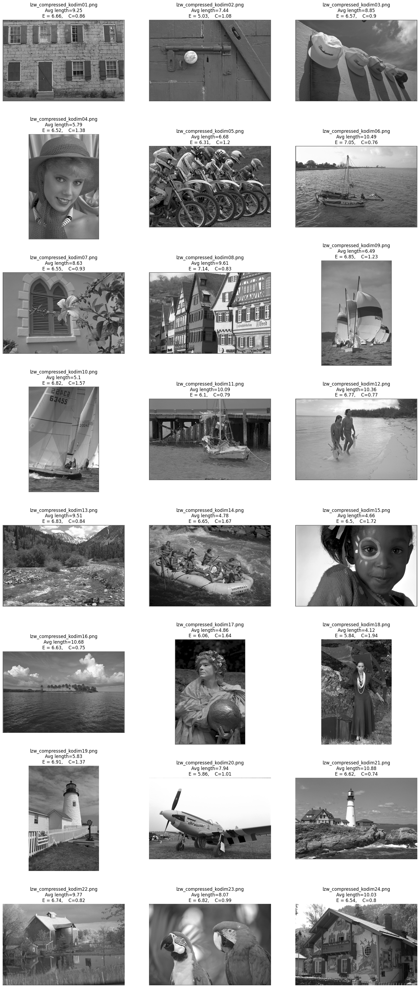

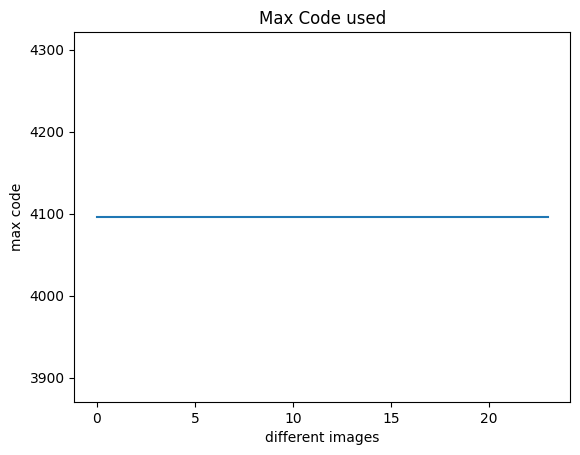

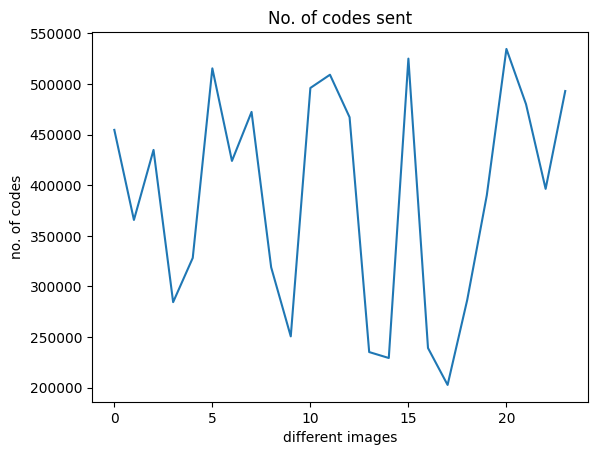

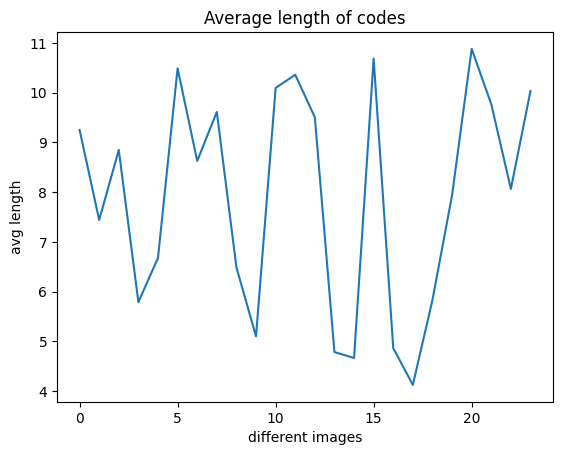

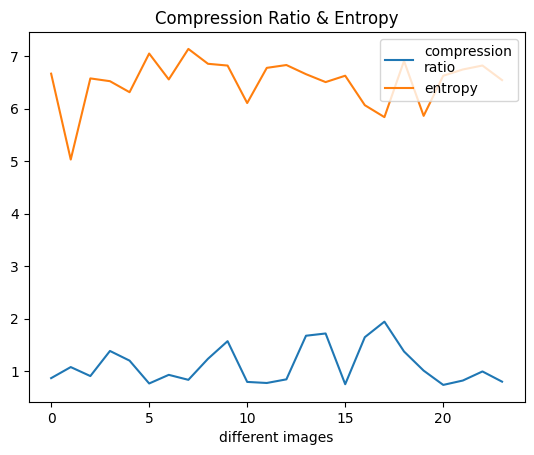

In [ ]:
def plot_data(title, ylabel, Y):
  plt.title(title)
  plt.ylabel(ylabel)
  plt.plot(Y)
  plt.xlabel("different images")
  plt.show()

def test_lzw(dir_name, to_print_imgs = True):

  block_size = -1
  codes_size = 12

  images = os.listdir(dir_name)
  images.sort()

  num_images = len(images)
  num_cols = 3
  num_rows = math.ceil(num_images/num_cols)

  if (to_print_imgs):
    fig = plt.figure(figsize=(20, 6*num_rows))
    plt.axis("off")

  index = 1

  max_code_arr = []
  n_codes_arr = []
  comp_ratio_arr, avg_length_arr, entropy_arr = [],[],[]

  for img_name in images:
    img_path = os.path.join(dir_name, img_name)

    original_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    max_code, n_codes, comp_ratio, avg_length, entropy = LZW_encoder(img_path, codes_size, block_size)
    encoded_file_name = os.path.join("./lzw_files", os.path.basename(img_name).split(".")[0]+".txt")
    decoded_img = LZW_decoder(encoded_file_name)

    max_code_arr.append(max_code)
    n_codes_arr.append(n_codes)
    comp_ratio_arr.append(comp_ratio)
    avg_length_arr.append(avg_length)
    entropy_arr.append(entropy)

    if to_print_imgs == True:

      fig.add_subplot(num_rows, num_cols, index)
      plt.title(f"lzw_compressed_{img_name}\n" +
                f"Avg length={round(avg_length,2)}\n" +
                f"E = {round(entropy,2)},    C={round(comp_ratio,2)}",
                fontsize=12)
      plt.axis('off')
      plt.imshow(decoded_img.astype("uint8"), cmap = 'gray')
      index += 1

  if to_print_imgs == True:
    plt.show()

  plot_data("Max Code used", "max code", max_code_arr)
  plot_data("No. of codes sent", "no. of codes", n_codes_arr)
  plot_data("Average length of codes", "avg length", avg_length_arr)

  plt.title("Compression Ratio & Entropy")
  plt.plot(comp_ratio_arr, label="compression\nratio")
  plt.plot(entropy_arr, label="entropy")
  plt.xlabel("different images")
  plt.legend(loc="upper right")
  plt.show()

test_lzw("./color_images", to_print_imgs = True)

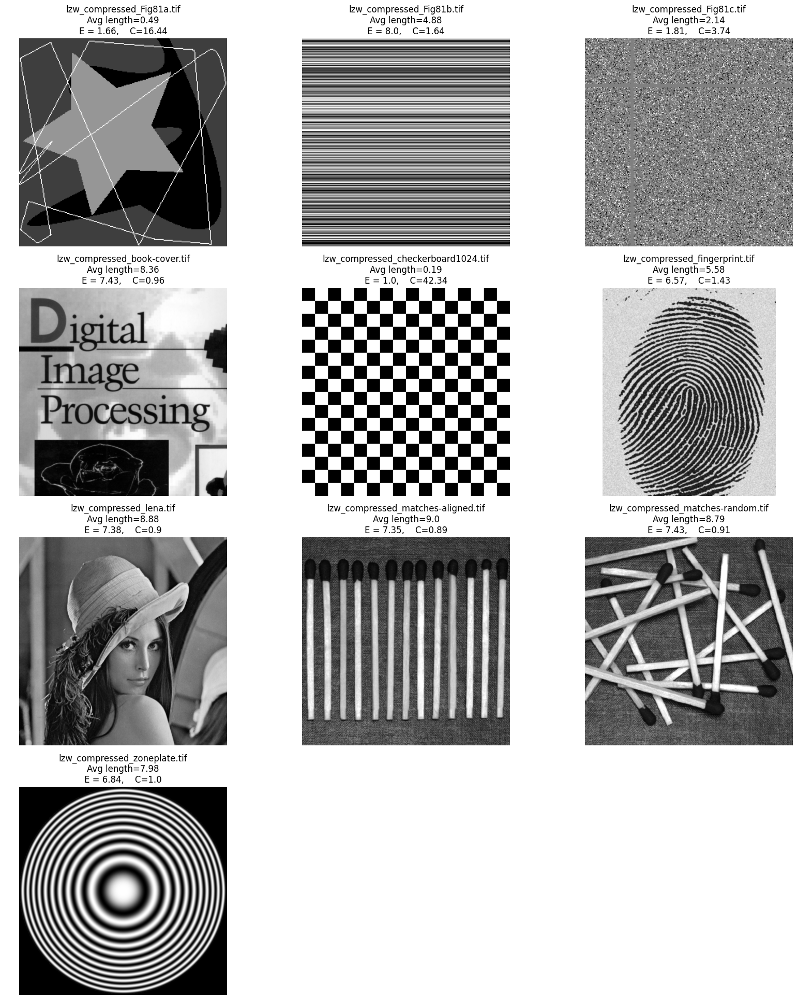

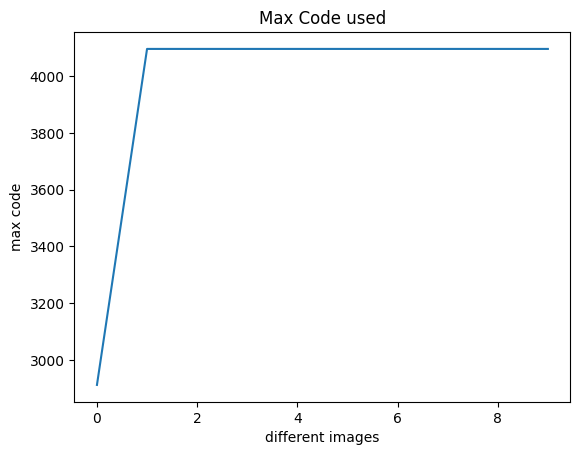

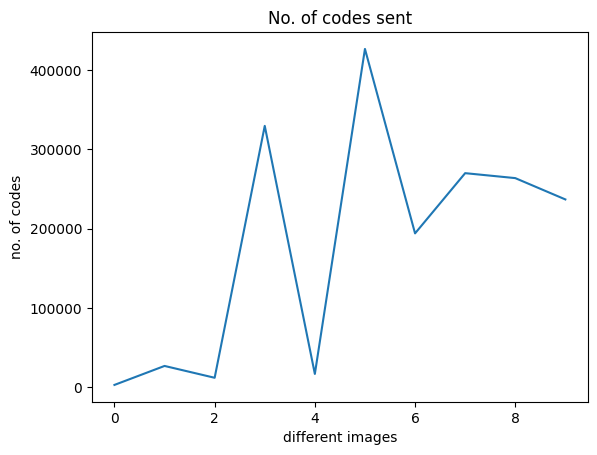

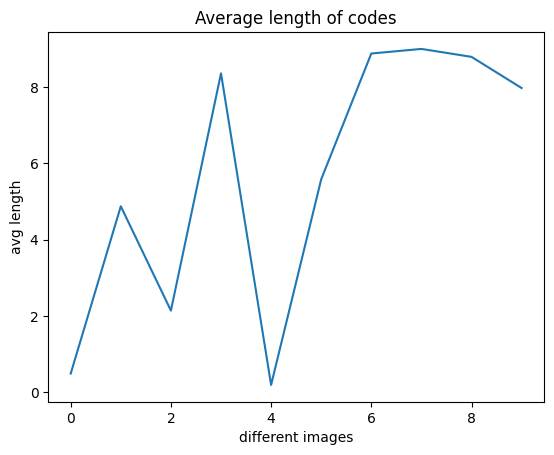

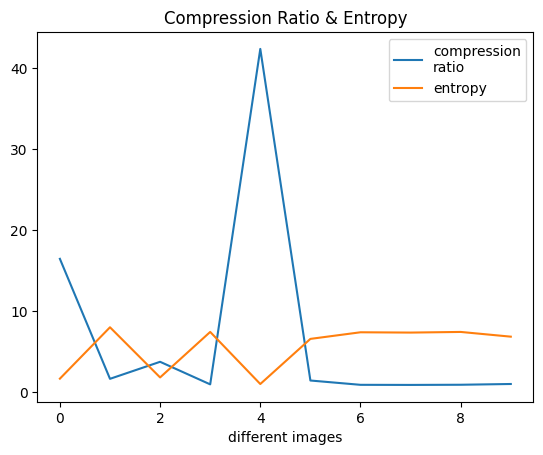

In [ ]:
test_lzw("./gray_images", to_print_imgs = True)

Original image:



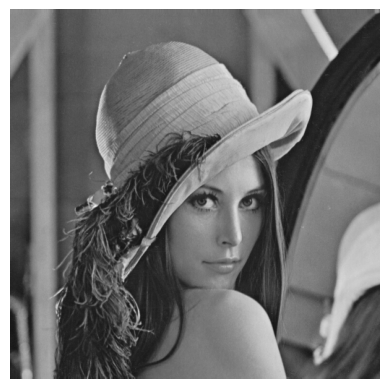


Effect of codes size:
[Default block size = entire image]



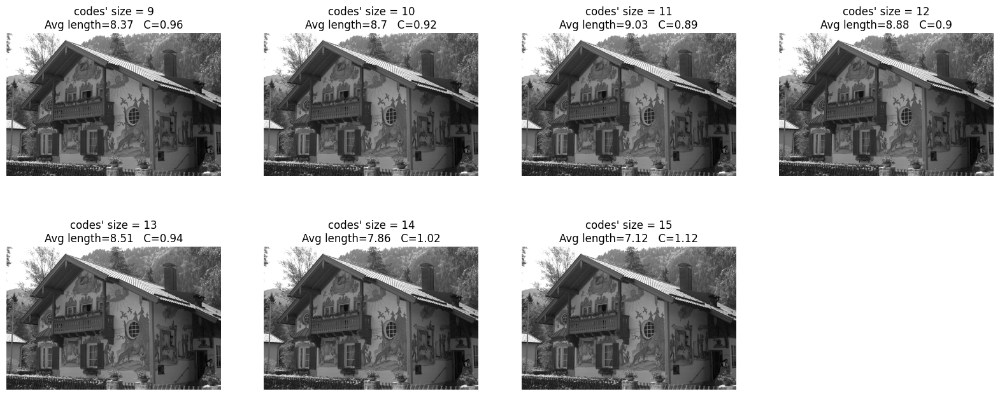


Analysis of codes' size:



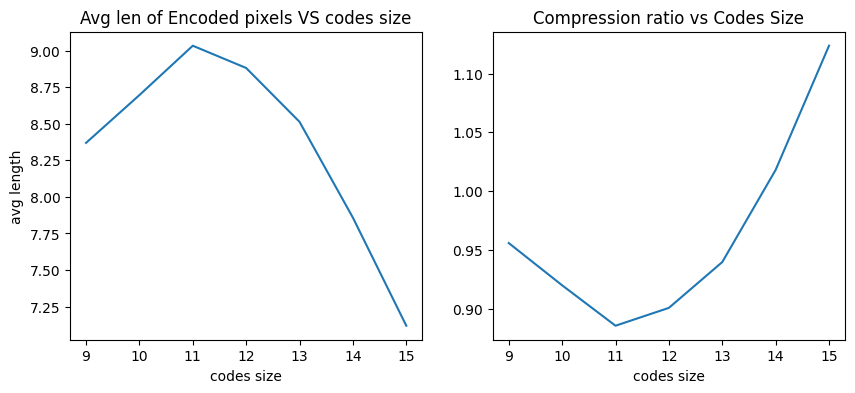


Effect of block size:
[Default codes size = 12]



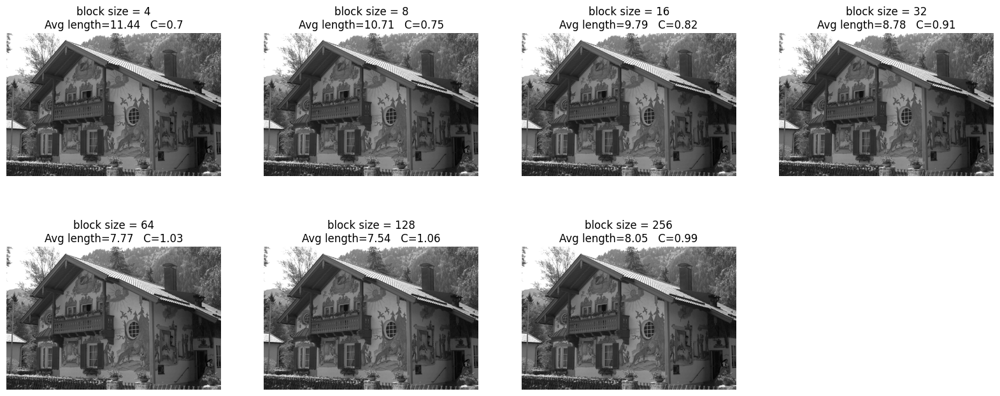


Analysis of block size:



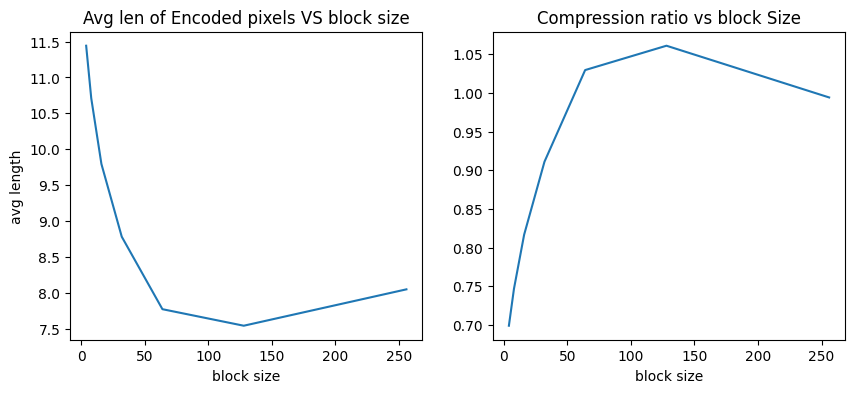

In [ ]:
# number of coefficients to be sent in jpeg encoding
codes_size_array = [ 9, 10, 11, 12, 13,14, 15]
block_size_array = [4, 8, 16, 32, 64, 128, 256]

def analyse_lzw_img(img_path):

  # default block size and default coefficients
  def_block_size = -1
  def_codes_size = 12

  img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

  print("Original image:\n")
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img.astype("uint8"), cv2.COLOR_BGR2RGB))
  plt.show()

  print("\nEffect of codes size:")
  print("[Default block size = entire image]\n")
  block_size = -1

  fig = plt.figure(figsize=(20, 8))
  index = 1

  max_code_arr = []
  n_codes_arr = []
  comp_ratio_arr, avg_length_arr, entropy_arr = [],[],[]

  for codes_size in codes_size_array:
    original_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    max_code, n_codes, comp_ratio, avg_length, entropy = LZW_encoder(img_path, codes_size, block_size)
    encoded_file_name = os.path.join("./lzw_files", os.path.basename(img_name).split(".")[0]+".txt")
    decoded_img = LZW_decoder(encoded_file_name)

    max_code_arr.append(max_code)
    n_codes_arr.append(n_codes)
    comp_ratio_arr.append(comp_ratio)
    avg_length_arr.append(avg_length)
    entropy_arr.append(entropy)

    fig.add_subplot(2, 4, index)
    plt.title(f"codes' size = {codes_size}\n"+
              f"Avg length={round(avg_length,2)}   C={round(comp_ratio,2)}",
              fontsize=12)
    plt.imshow(decoded_img.astype("uint8"), cmap = 'gray')
    plt.axis("off")
    index += 1
  plt.show()

  print("\nAnalysis of codes' size:\n")

  fig = plt.figure(figsize=(10, 4))

  fig.add_subplot(1,2,1)
  plt.title("Avg len of Encoded pixels VS codes size")
  plt.ylabel("avg length")
  plt.xlabel("codes size")
  plt.plot(codes_size_array, avg_length_arr)

  fig.add_subplot(1,2,2)
  plt.title("Compression ratio vs Codes Size")
  plt.xlabel("codes size")
  plt.plot(codes_size_array,comp_ratio_arr)
  plt.show()


  print("\nEffect of block size:")
  print("[Default codes size = 12]\n")
  codes_size = 12

  fig = plt.figure(figsize=(20, 8))
  index = 1

  max_code_arr = []
  n_codes_arr = []
  comp_ratio_arr, avg_length_arr, entropy_arr = [],[],[]

  for block_size in block_size_array:
    original_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    max_code, n_codes, comp_ratio, avg_length, entropy = LZW_encoder(img_path, codes_size, block_size)
    encoded_file_name = os.path.join("./lzw_files", os.path.basename(img_name).split(".")[0]+".txt")
    decoded_img = LZW_decoder(encoded_file_name)

    max_code_arr.append(max_code)
    n_codes_arr.append(n_codes)
    comp_ratio_arr.append(comp_ratio)
    avg_length_arr.append(avg_length)
    entropy_arr.append(entropy)

    fig.add_subplot(2, 4, index)
    plt.title(f"block size = {block_size}\n"+
              f"Avg length={round(avg_length,2)}   C={round(comp_ratio,2)}",
              fontsize=12)
    plt.imshow(decoded_img.astype("uint8"), cmap = 'gray')
    plt.axis("off")
    index += 1
  plt.show()

  print("\nAnalysis of block size:\n")

  fig = plt.figure(figsize=(10, 4))

  fig.add_subplot(1,2,1)
  plt.title("Avg len of Encoded pixels VS block size")
  plt.ylabel("avg length")
  plt.xlabel("block size")
  plt.plot(block_size_array, avg_length_arr)

  fig.add_subplot(1,2,2)
  plt.title("Compression ratio vs block Size")
  plt.xlabel("block size")
  plt.plot(block_size_array,comp_ratio_arr)
  plt.show()

analyse_lzw_img("./gray_images/lena.tif")